## 병합 정렬
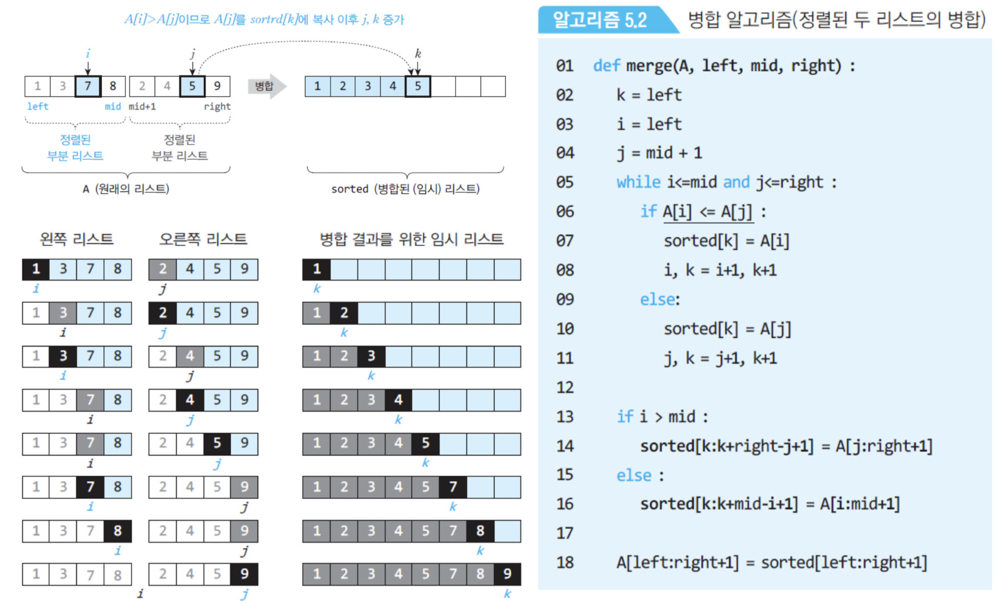

A[i] > A[i] 이면 A[j]를 sorted[k]로 복사하고 j와 k를 증가  
A[i] <= A[i] 이면 A[i]를 sorted[k]로 복사하고 i와 k를 증가

In [1]:
def merge_sort(A, left, right) :    # A[left..right]를 오름차순으로 정렬

    if left<right :      # 항목이 2개 이상인 경우

        mid = (left + right) // 2       # 리스트의 균등 분할

        merge_sort(A, left, mid)       # 부분 리스트 정렬

        merge_sort(A, mid + 1, right)    # 부분 리스트 정렬

        merge(A, left, mid, right)     # 병합

    # else: 항목이 1개 인 경우. 자동으로 정복되었음(하나이므로)

 

 

def merge(A, left, mid, right) :

    k = left            # 병합을 위한 임시 리스트의 인덱스

    i = left            # 왼쪽 리스트의 인덱스

    j = mid + 1         # 오른쪽 리스트의 인덱스

    while i<=mid and j<=right :

        if A[i] <= A[j] :         # 기본 연산

            sorted[k] = A[i]

            i, k = i+1, k+1

        else:

            sorted[k] = A[j]

            j, k = j+1, k+1

 

    if i > mid :               # 한쪽에 남아 있는 레코드의 일괄 복사
        sorted[k:k+right-j+1] = A[j:right+1]   # 리스트의 슬라이싱 이용
    else :

        sorted[k:k+mid-i+1] = A[i:mid+1]     # 리스트의 슬라이싱 이용

    A[left:right+1] = sorted[left:right+1]    # sorted를 A에 다시 복사


data = [ 5, 3, 8, 4, 9, 1, 6, 2, 7]   # 입력 리스트

sorted = [0] * len(data)      # 길이가 len(data)인 임시 리스트를

print("Original  : ", data)     # 만들고 모든 항목을 0으로 초기화

merge_sort(data, 0, len(data)-1)    # 병합 정렬

print("MergeSort : ", data)

 

Original  :  [5, 3, 8, 4, 9, 1, 6, 2, 7]
MergeSort :  [1, 2, 3, 4, 5, 6, 7, 8, 9]


### 입력 구성에 따른 차이가 없음
### 항상 동일한 시간에 정렬이 완료
### 병합정렬은 순환호출 구조에 따라서 n=2^k 이라 가정
### k=log2^n
부분 배열의 크기 : 2^k => 2^(k-1) => 2^0 복잡도 함수  
T(n)=2T(n/2)+T_merge(n)  
F(1) = 0  

## a =b=2 , f(n) = n-1 => O(n) >= O(n^1) => d=1 2번째 마스터정리 a=b^d. 
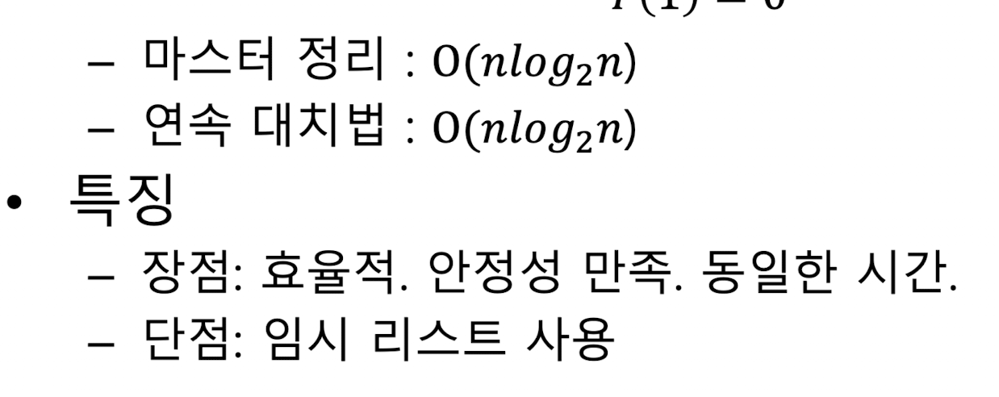

### 퀵정렬
#### 값에 따른 분할 , 위치는 병합정렬과 다르게 리스트가 균등 분할X

### 분할: 피벗선택(편의상 첫번째 항목), 피벗 보다 작은 항목은 피벗의 왼쪽이동, 큰 항목은 오른쪽 이동  

### 정복: 분할 후 정렬위해 분할 정복 다시 사용 , 리스트 크기 1이면 이미 정복  

### 결합: 병합X, 분할과 정복이 모두끝나면 그자체가 정렬 완료  

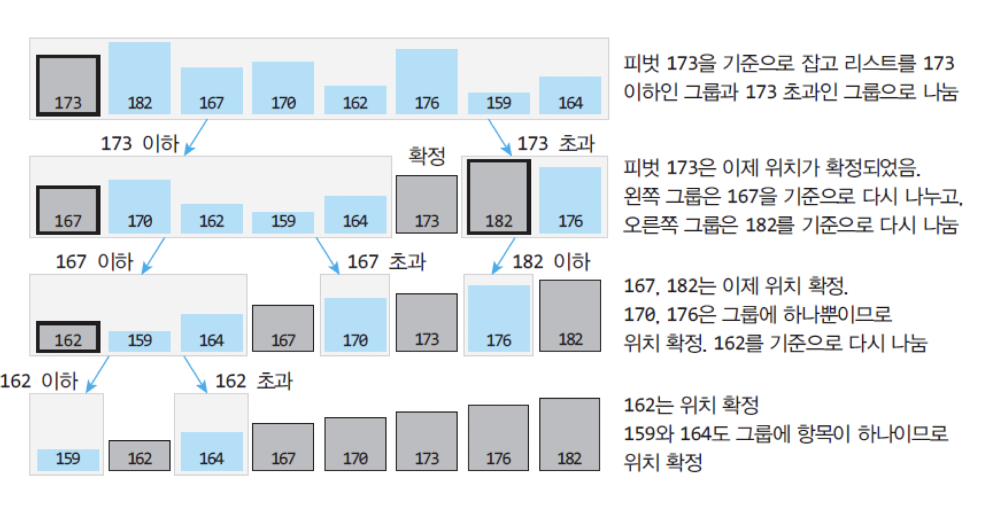

### 입력 구성에 따른 차이가 있음

### 최선의 경우 - 분할이 항상 균등하게 이루어지는 경우 n/2, n/4, n/8,...    𝑛= 2^𝑘라 가정, 병합정렬과 같음
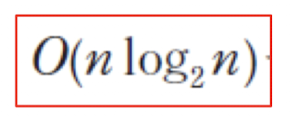

 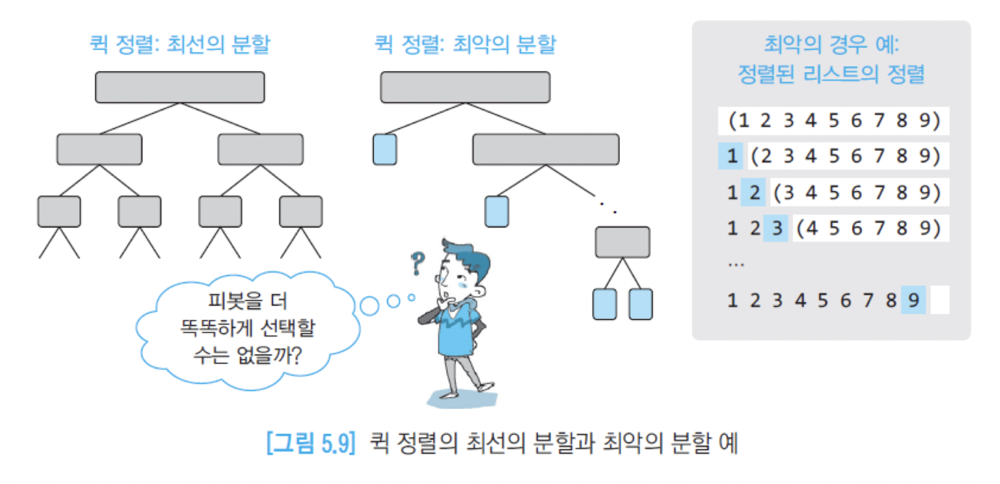
 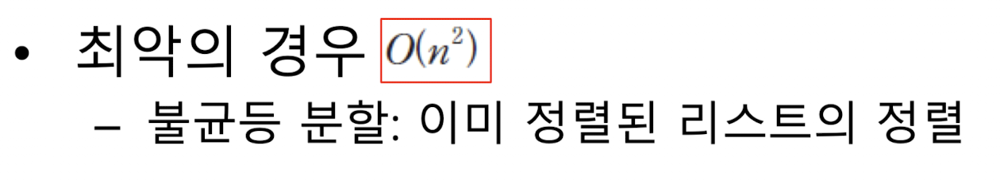
 ## 퀵 정렬이 빠른이유: 불필요한 데이터 이동 줄이고 먼 거리 데이터교환, 한번 결정된 피벗들이 추후 연산에서 제외  

### 개선을 위한 노력들  

### median of three:피벗을 리스트의 중앙값에 가깝도록 선택하는 방법(피벗을 왼쪽, 오른쪽, 중간 값 3개중 중간값 선택  

### 이중 피벗 퀵 정렬(dual pivot quick sort): 분할을 3그룹, 2개의 피벗 사용  

### 하이브리드(hybrid) 정렬 :퀵정렬은 정렬된 리스트에서 최악, 거의 정렬된 리스트에 효율적인 삽입정렬과 함께 사용


In [2]:
def quick_sort(A, left, right) :     # A[left..right]를 오름차순으로 정렬

    if left<right :                # 정렬 범위가 2개 이상인 경우

        mid = partition(A, left, right)     # 좌우로 분할 

        quick_sort(A, left, mid-1)    # 왼쪽 부분리스트를 퀵 정렬

        quick_sort(A, mid+1, right)     # 오른쪽 부분리스트를 퀵 정렬

 

 

 

def partition(A, left, right) :

    low = left + 1           # 왼쪽 부분 리스트의 인덱스 (증가방향)

    high = right              # 오른쪽 부분 리스트의 인덱스 (감소방향)

    pivot = A[left]            # 피벗 설정 

    while (low <= high) :     # low와 high가 역전되지 않는 한 반복 

        while low <= right and A[low] < pivot : low += 1

        while high >= left and A[high]> pivot : high-= 1

 

        if low < high :            # 선택된 두 레코드 교환 

            A[low], A[high] = A[high], A[low]

 

    A[left], A[high] = A[high], A[left]# 마지막으로 high와 피벗 항목 교환 

    return high    # 피벗의 위치 반환
 

data = [ 5, 3, 8, 4, 9, 1, 6, 2, 7 ]    # 입력 리스트

print("Original  : ", data)

quick_sort(data, 0, len(data)-1)        # 병합 정렬

print("QuickSort : ", data)

Original  :  [5, 3, 8, 4, 9, 1, 6, 2, 7]
QuickSort :  [1, 2, 3, 4, 5, 6, 7, 8, 9]


### 5.4 이진 트리(모든 노드가 2개의 서브트리) 관련 문제

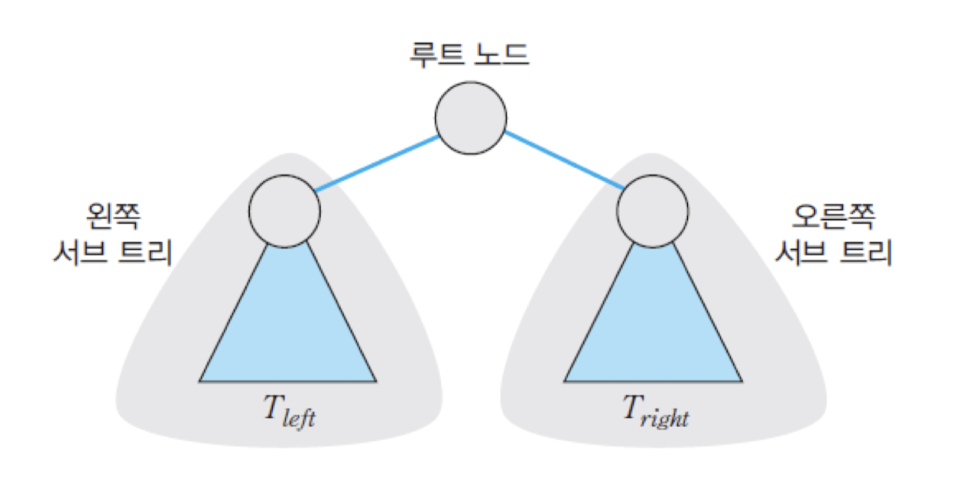
### 이진트리에도 분할 정복 기법 적용
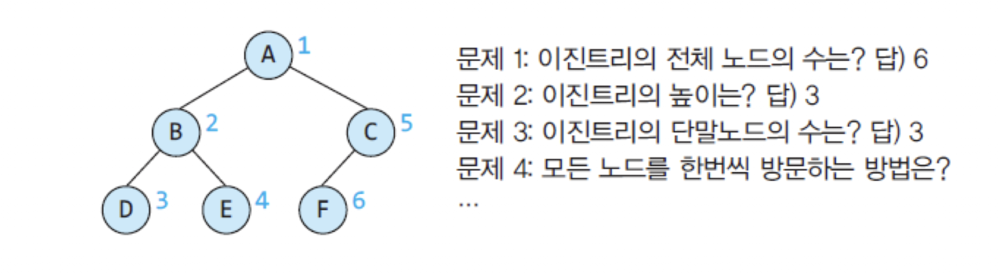
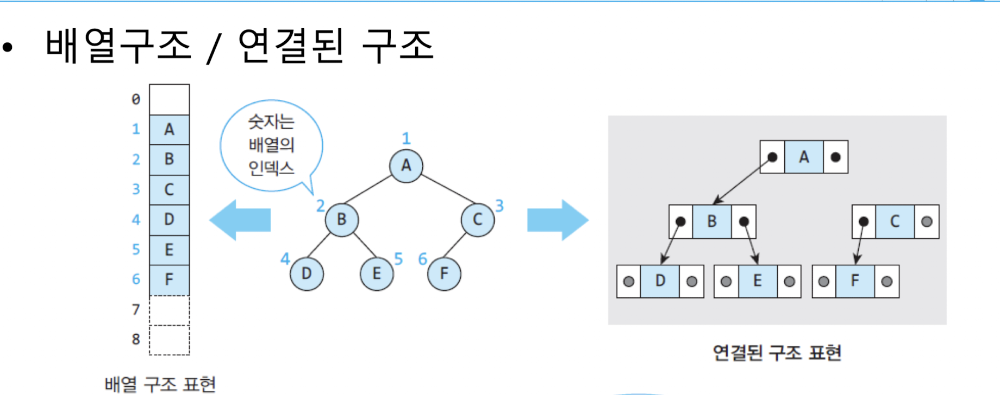

### 여기서는 링크표현법(연결된 구조)
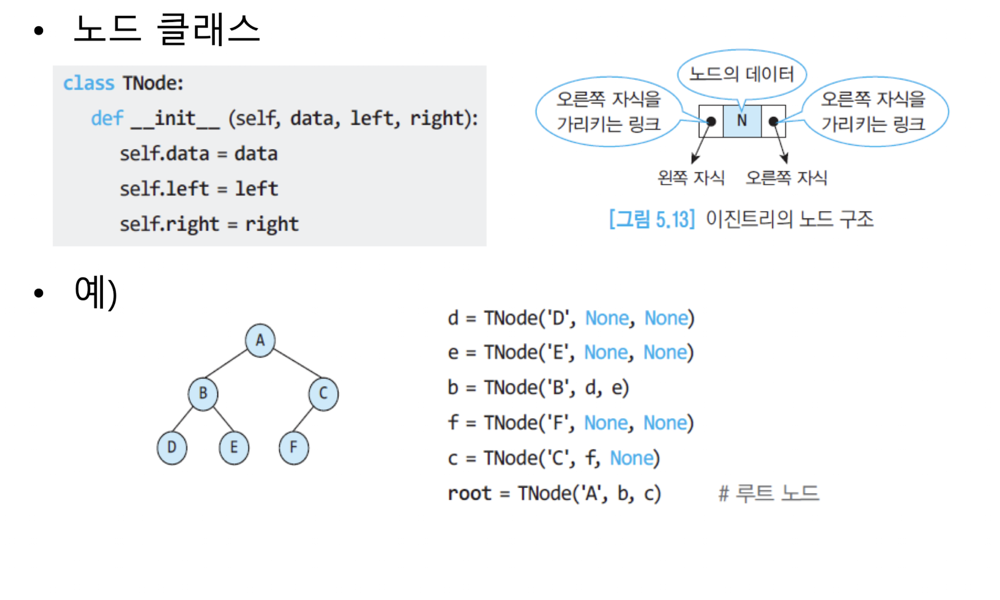

### 분할 정복 아이디어
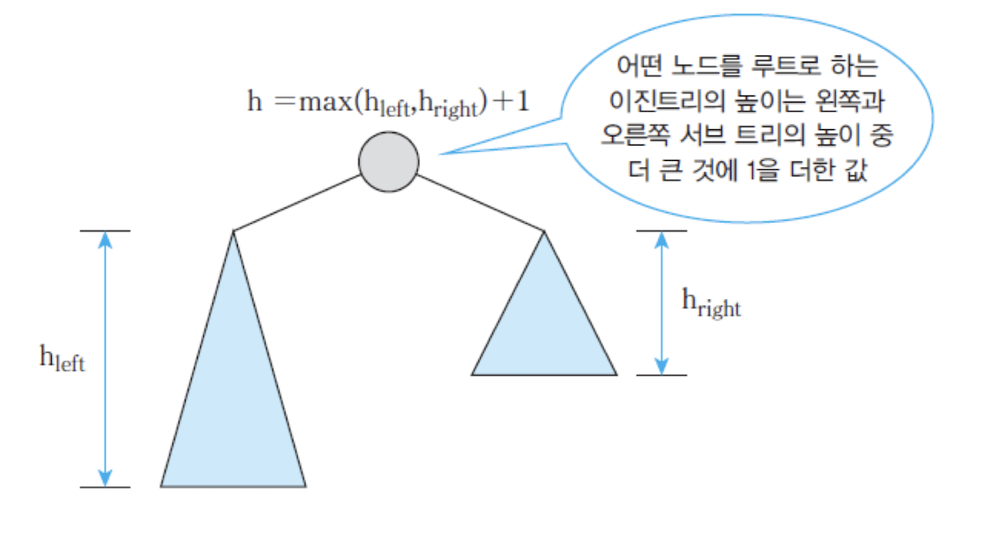

In [3]:
class TNode:       # 이진트리를 위한 노드 클래스

    def __init__ (self, data, left, right):# 생성자

        self.data = data       # 노드의 데이터

        self.left = left      # 왼쪽 자식을 위한 링크

        self.right = right    # 오른쪽 자식을 위한 링크


def calc_height(root) :     # 루트노드 root

    if root is None :       # 공백 트리이면 --> 0을 반환

        return 0           #  높이가 0 --> 0을 반환

    hLeft = calc_height(root.left)   # 왼쪽 트리의 높이 --> hLeft

    hRight = calc_height(root.right) # 오른쪽 트리의 높이 --> hRight

    return max(hLeft,hRight) + 1    # 더 높은 높이에 1을 더해 반환.

 
d = TNode('D', None, None)

e = TNode('E', None, None)

b = TNode('B', d, e)

f = TNode('F', None, None)

c = TNode('C', f, None)

root = TNode('A', b, c)   # 루트 노드

print(" 트리의 높이 =", calc_height(root))

 트리의 높이 = 3


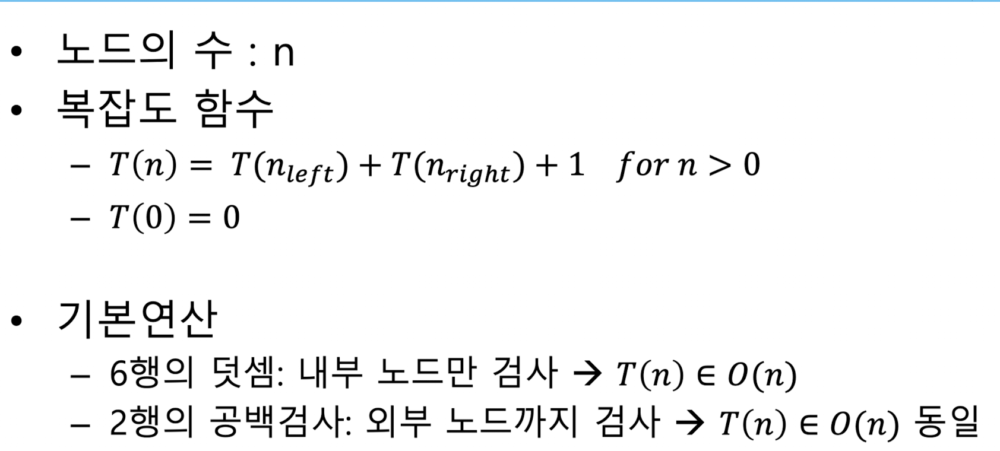

### 이진트리의 표준 순회 문제
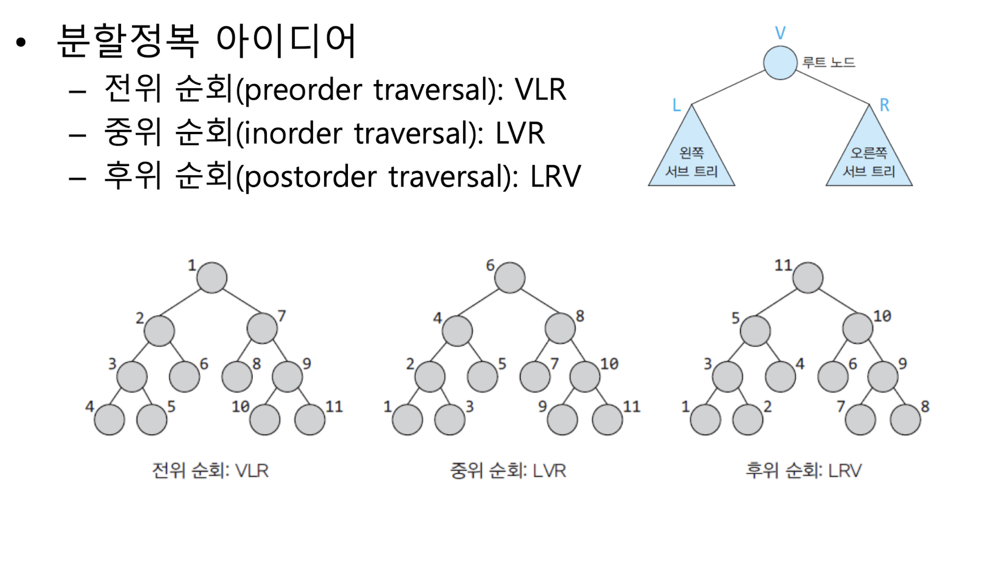
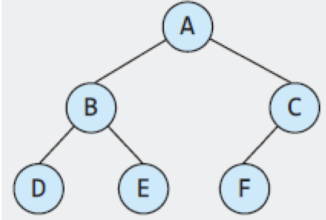
전위 순회 : A-B-D-E-C-F  
중위 순회 : D-B-E-A-F-C  
후위 순회 : D-E-B-F-C-A

In [5]:
class TNode:            # 이진트리를 위한 노드 클래스

    def __init__ (self, data, left, right):   # 생성자

        self.data = data       # 노드의 데이터

        self.left = left      # 왼쪽 자식을 위한 링크

        self.right = right    # 오른쪽 자식을 위한 링크

 

 

def preorder(n) :             # 전위 순회 함수

    if n is not None :

        print(n.data, end=' ')    # 먼저 루트노드 처리(화면 출력)

        preorder(n.left)      # 왼쪽 서브트리 처리

        preorder(n.right)     # 오른쪽 서브트리 처리

 

 

def inorder(n) :              # 중위 순회 함수

    if n is not None :

        inorder(n.left)   # 왼쪽 서브트리 처리

        print(n.data, end=' ')   # 루트노드 처리(화면 출력)

        inorder(n.right)    # 오른쪽 서브트리 처리

 

 

def postorder(n) :

    if n is not None :

        postorder(n.left)

        postorder(n.right)

        print(n.data, end=' ')

 

 

d = TNode('D', None, None)

e = TNode('E', None, None)

b = TNode('B', d, e)

f = TNode('F', None, None)

c = TNode('C', f, None)

root = TNode('A', b, c)   # 루트 노드


print('   In-Order : ', end='')

inorder(root)

print()

print('  Pre-Order : ', end='')

preorder(root)

print()

print(' Post-Order : ', end='')

postorder(root)

print()

   In-Order : D B E A F C 
  Pre-Order : A B D E C F 
 Post-Order : D E B F C A 


### 5.5 최근접 쌍의 거리(심화)
### 억지기법 가능한 모든 점의 쌍에 거리계산, 가장 짧은 것 찾기
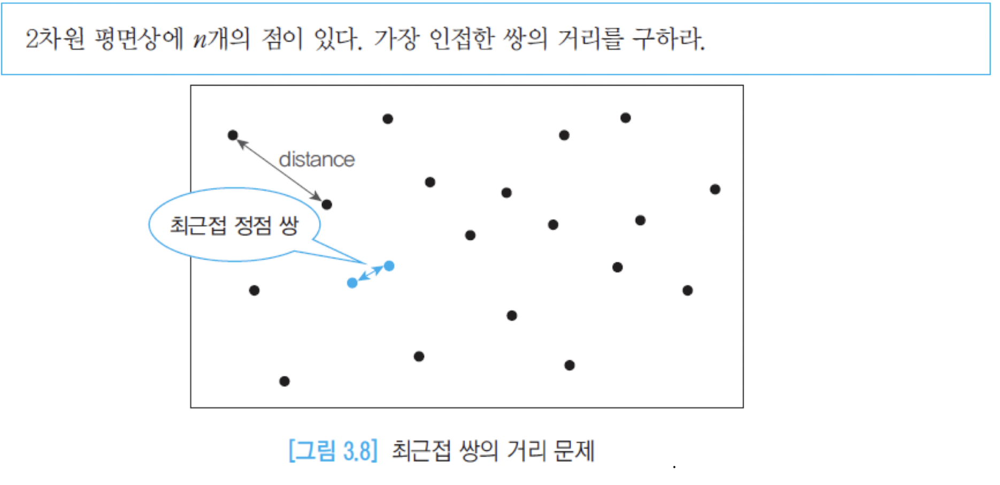
실생활에서 점들  
공항의 비행기,도로상의 자동차, 우체국의 위치, 데이터베이스 레코드 , DNA 샘플 등 다양한 객체들로 대응됨  
유클리드 거리 사용

### 최근접 쌍의 거리 문제(심화) 분할정복 사용하여 개선
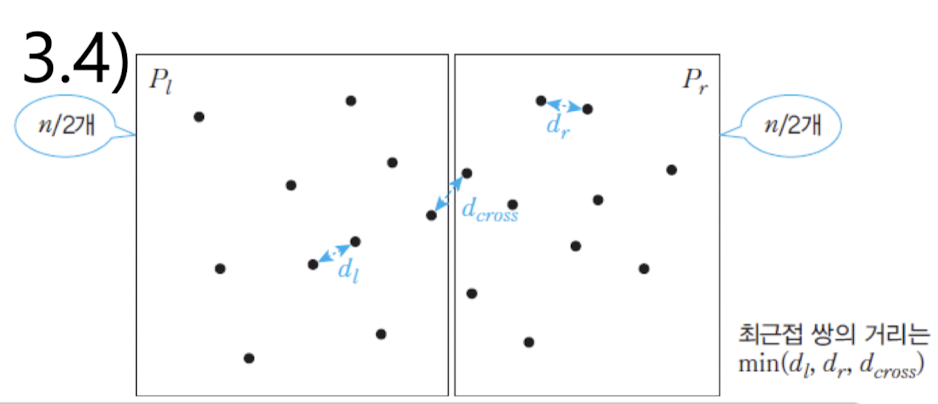

### 리스트 분할 P1,Pr,   P가 x좌표로 정렬  P1(리스트 왼쪽 절반),Pr(리스트 오른쪽 절반)  

 

그림5.19 20개의 점 좌우 10개로 분할

 

### 분할된 점들 개수가 3이하인 경우 계산후 억지기법 이용 , 4개이상이면  분할정복 다시  

###  P1(리스트 왼쪽 절반),Pr(리스트 오른쪽 절반)에서 최근접쌍 거리 d1, dr로 계산결과와

### 양쪽 그룹에 최근접  점의 상에의한 거리 𝑑_𝑐𝑟𝑜𝑠𝑠중 가장 작은 값 반환  

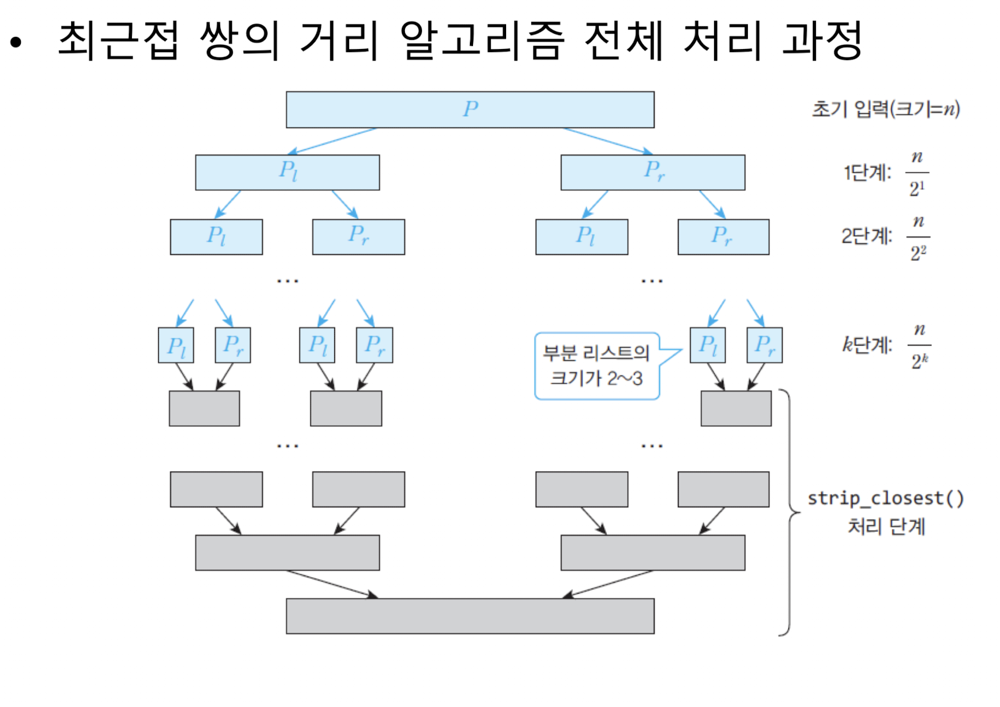
d_Cross의 계산  
#### 폭이 2d인 띠 영역에서만 처리하면 됨 (d = min(d1,dr) d1은 왼쪽 Left 의미
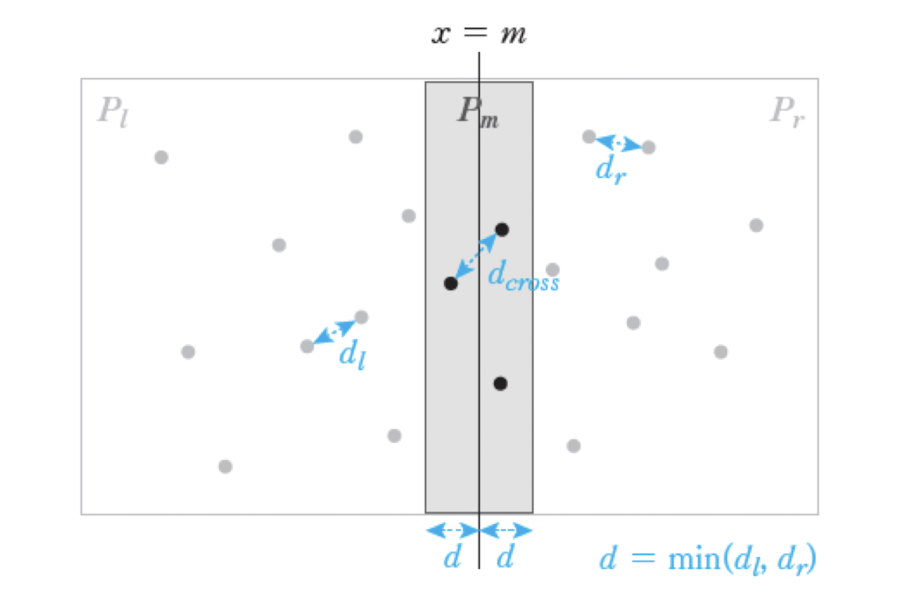
### 분할 중심 x=m으로부터 d 이상 떨어진 점들은 고려 x
### why  분할 중심 x=m으로부터 거리가 무조건 d이상
### Pm의 모든 점 y좌표 기준 오름차순 정렬
### 가장 작은 거리 Pi를 시작점 dcross 계속 갱신
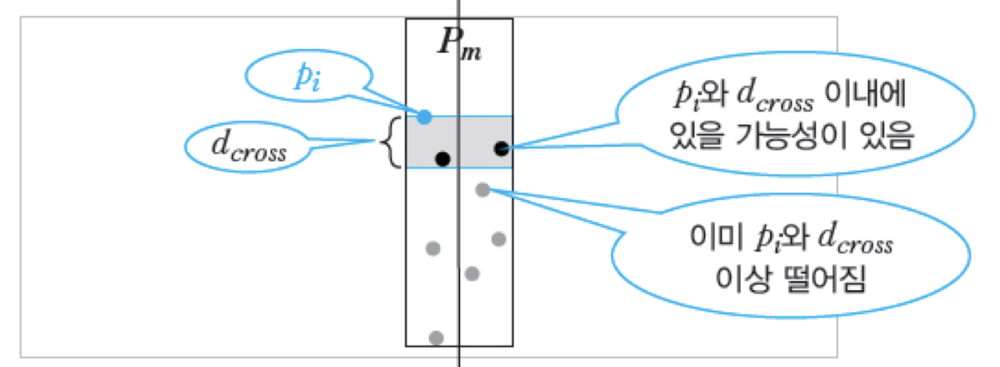


In [6]:
import math         # math 모듈 포함. 제곱근(sqrt) 함수 사용을 위해

def distance(p1, p2):      # Euclidean 거리 계산 함수

    return math.sqrt((p1[0]-p2[0])**2 + (p1[1]-p2[1])**2)

 

 

 

def closest_pair(p):

    n = len(p)                      # 점의 전체 개수

    mindist = float("inf")          # 최근접 거리 초기화(무한대)

    for i in range(n-1):

        for j in range(i+1, n):

            dist = distance(p[i], p[j])   # 유클리드 거리 계산

            if dist < mindist:

                mindist = dist

    return mindist

  

 

def strip_closest(P, d): 

    n = len(P)                  # 리스트내의 점의 수

    d_min = d

    P.sort(key = lambda point: point[1])  # y축을 따라 정렬  ## 애를 나중에 지우고 정렬된 상태에서 진행 

  

    for i in range(n):          # y가 최소인 점부터 순서대로

        j = i + 1

        # P[i].y와 P[j].y의 차이가 d_min 이내일 때 까지만 처리

        while j < n and (P[j][1] - P[i][1]) < d_min: 

            dij = dist(P[i], P[j]) 

            if dij < d_min :

                d_min = dij

            j += 1

    return d_min                # d_min 반환

 

  

def closest_pair_dist(P, n): 

    if n <= 3:                  # 점이 3개 이하이면, brute force로 바로 계산

                                  

        return closest_pair(P)    # 억지기법 알고리즘(알고리즘 3.4) 

 

    mid = n // 2           # 중앙점을 찾음. P는 현재 x로 정렬되어 있음

    mid_x = P[mid][0]    # 중앙점의 x좌표 

 

    dl = closest_pair_dist(P[:mid], mid)     # Pl에서 dl 계산

    dr = closest_pair_dist(P[mid:], n-mid)  # Pr에서 dr 계산

    d = min(dl, dr)    # d는 둘 중에서 더 짧은 거리

                        # merge(P, 0, mid, n-1) 삽입하여 알고리즘 개선 개선 

    Pm = []            # 중앙에서 x좌표가 d이내인 점들의 집합 Pm을 만듦

    for i in range(n):  # Pm도 x에 대해 정렬되어 있음

        if abs(P[i][0] - mid_x) < d:  

            Pm.append(P[i]) 

 

    ds = strip_closest(Pm, d)   # Pm내에서 d보다 작은 최근접쌍 거리 찾기    

    

    return min(d, ds)

 

 

 

p = [(2, 3), (12, 30), (40, 50), (5, 1), (12, 10), (3, 4)]

p.sort(key = lambda point: point[0])    # 전처리: 점들을 x순으로 정렬   미리 정렬

print("가장 가까운 두 점의 거리", closest_pair_dist(p, len(p))) 

가장 가까운 두 점의 거리 1.4142135623730951


In [7]:
 

def merge(P, left, mid, right) :

    sorted = [None]*(right-left+1)

    k, i, j = left, left, mid+1

    while i<=mid and j<=right :

        if P[i][1] <= P[j][1] :

            sorted[k] = P[i]

            i, k = i+1, k+1

        else:

            sorted[k] = P[j]

            j, k = j+1, k+1

    if i > mid :

        sorted[k:k+right-j+1] = P[j:right+1]

    else :

        sorted[k:k+mid-i+1] = P[i:mid+1]

 

    P[left:right+1] = sorted[left:right+1]

##  복잡도는O(n(log2^n)^2). 이를 O(nlog2^n)으로 개선하기위해 dcross(띠 영역의 y좌표기준 정렬)의 처리 복잡도를 O(nlog2^n)에서 O(n)으로 처리해야 한다.

![image.png](attachment:image.png)


 ### 알고리즘 5.8의 strip_closest()  
### - 𝑂(𝑛𝑙𝑜𝑔2^𝑛)  
### 전체 처리 단계의 수  𝑘=𝑙𝑜𝑔2^𝑛  
### 복잡도( 전체 단계수 k에 비례하므로)
### - 𝑂(𝑘 𝑛𝑙𝑜𝑔2^𝑛) = 𝑂(𝑛(𝑙𝑜𝑔2^𝑛)^2) 

개선 

strip_closest()를 𝑂(𝑛)에 처리할 수 있음. How?
복잡도: 𝑂(𝑛𝑙𝑜𝑔2^𝑛)  -> 이 문제의 최적 알고리즘

 
## 해결 방법
### strip_closest()에서 정렬사용X(호출하기전 미리 정렬)  
P.sort(key = lambda point: point[1])=>리스트, 튜플에서 2번째 항목  애를 빼고 병합정렬 시작

[(2, 3), (12, 30), (40, 50), (5, 1), (12, 10), (3, 4)]=>  

[(5, 1), (2, 3), (3, 4),  (12, 10), (12, 30), (40, 50)]


### closest_pair_dist()의  45~48행에서 정렬된 부분 리스트들을 병합 알고리즘 이용  

y방향 정렬은 부분리스트가 3이하인 상황, 즉, 억지 기법 최근접쌍 거리 구하는 부분에서 시작  

### strip_closest2(P, d)에서 y축 정렬 더많은 시간 필요(nlog2^n)

### strip_closest(P, d)에서 P.sort(key = lambda point: point[1]) 제거하고  

### closest_pair_dist(P, d)에

### 정렬된 부분 리스트들을 병합하는 병합알고리즘을 삽입하여 알고리즘 개선 개선한다.

                        # merge(P, 0, mid, n-1) 삽입하여 알고리즘 개선 개선 
                        
                        # 밑에 코드가 알고리즘 개선 버젼

In [8]:
import math         # math 모듈 포함. 제곱근(sqrt) 함수 사용을 위해

def distance(p1, p2):      # Euclidean 거리 계산 함수

    return math.sqrt((p1[0]-p2[0])**2 + (p1[1]-p2[1])**2)


def closest_pair(p):
    n = len(p)                      # 점의 전체 개수
    mindist = float("inf")          # 최근접 거리 초기화(무한대)
    for i in range(n-1):
        for j in range(i+1, n):
            dist = distance(p[i], p[j])   # 유클리드 거리 계산
            if dist < mindist:
                mindist = dist
    return mindist

def merge(P, left, mid, right) :
    sorted = [None]*(right-left+1)
    k, i, j = left, left, mid+1
    while i<=mid and j<=right :
        if P[i][1] <= P[j][1] :
            sorted[k] = P[i]
            i, k = i+1, k+1
        else:
            sorted[k] = P[j]
            j, k = j+1, k+1
    if i > mid :
        sorted[k:k+right-j+1] = P[j:right+1]
    else :
        sorted[k:k+mid-i+1] = P[i:mid+1]
    P[left:right+1] = sorted[left:right+1]

def strip_closest2(P, d): 
    n = len(P)                  # 리스트내의 점의 수
    d_min = d
#    P.sort(key = lambda point: point[1])  # y축을 따라 정렬
    for i in range(n):          # y가 최소인 점부터 순서대로
        j = i + 1
        # P[i].y와 P[j].y의 차이가 d_min 이내일 때 까지만 처리
        while j < n and (P[j][1] - P[i][1]) < d_min: 
            dij = dist(P[i], P[j]) 
            if dij < d_min :
                d_min = dij

            j += 1
    return d_min                # d_min 반환

def closest_pair_dist2(P, n): 

    if n <= 3:    # 점이 3개 이하이면, brute force로 바로 계산

 

        return closest_pair(P)    # 억지기법 알고리즘(알고리즘 3.4) 

    mid = n // 2           # 중앙점을 찾음. P는 현재 x로 정렬되어 있음
    mid_x = P[mid][0]    # 중앙점의 x좌표 
    dl = closest_pair_dist2(P[:mid], mid)     # Pl에서 dl 계산
    dr = closest_pair_dist2(P[mid:], n-mid)  # Pr에서 dr 계산
    d = min(dl, dr)    # d는 둘 중에서 더 짧은 거리
    merge(P, 0, mid, n-1)  #정렬된 부분 리스트들을 병합하는 병합알고리즘을 삽입하여 알고리즘 개선 개선한다.
                        # merge(P, 0, mid, n-1) 삽입하여 알고리즘 개선 개선 
    Pm = []            # 중앙에서 x좌표가 d이내인 점들의 집합 Pm을 만듦
    for i in range(n):  # Pm도 x에 대해 정렬되어 있음
        if abs(P[i][0] - mid_x) < d:  
            Pm.append(P[i])

    ds = strip_closest2(Pm, d)   # Pm내에서 d보다 작은 최근접쌍 거리 찾기    closest_pair_dist2(Pm, d)으로 수정하여 알고리즘 개선
    return min(d, ds)

 

 

 

p = [(2, 3), (12, 30), (40, 50), (5, 1), (12, 10), (3, 4)]

p.sort(key = lambda point: point[0])    # 전처리: 점들을 x순으로 정렬

print("가장 가까운 두 점의 거리", closest_pair_dist2(p, len(p))) 

가장 가까운 두 점의 거리 1.4142135623730951


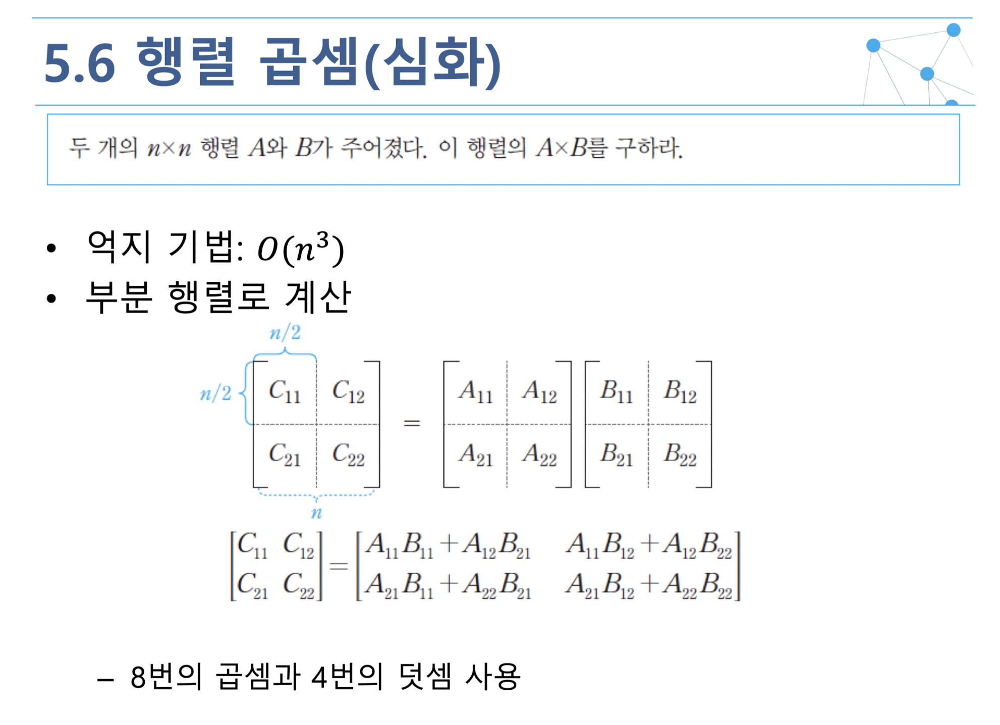

## 쉬트라센 전략
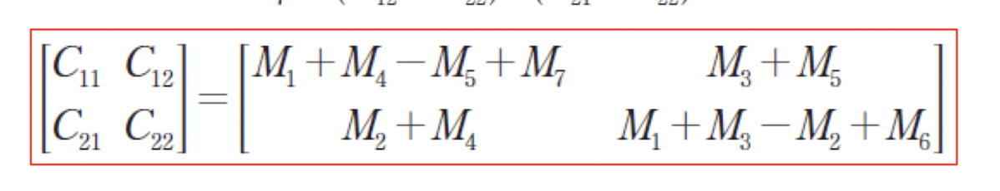

연산 수 
7번의 곱셈  
18번의 덧셈/뺄셈  
억지기법보다 효율적인가?

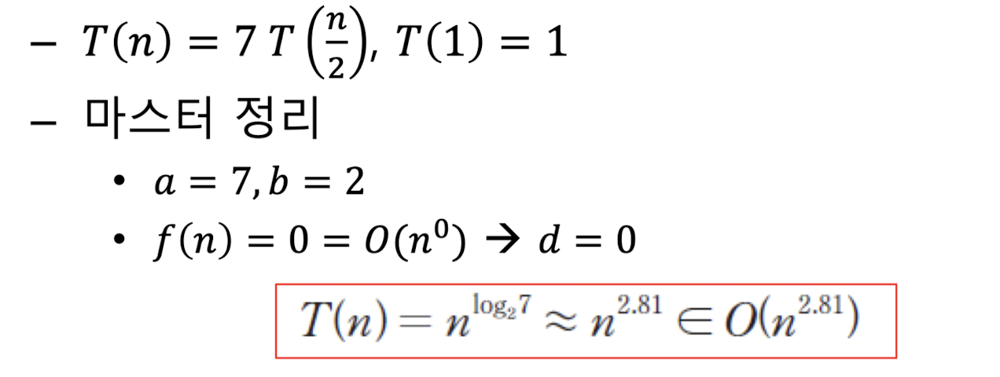
 
## 자주사용 안함 이거 나옴
## O(n^3)에 비해 약간 개선된 O(n^2.81)
### 순환과정에서 생성되는 부분 행렬위한 추가 메모리가 필요
### 실수들 정확히 표현X, 약간의 에러가 발생 가능성
### 크기 0인 희소행렬의 곱은 더 효율적인 알고리즘 존재
### n이 그렇게 크지 않은 경우 억지기법이 더 효율적일 수 ~


In [ ]:
import numpy as np     # numpy모듈을 np란 이름으로 사용함

def strassen(A, B):     # A, B : numpy모듈의 array 객체

    n = len(A)

    if n == 1:          # 1x1 행렬

        return A * B      # 실수의 곱셈

 

    n2 = n//2

    A11, A12, A21, A22 = A[:n2, :n2], A[:n2, n2:], A[n2:, :n2], A[n2:, n2:] 

    B11, B12, B21, B22 = B[:n2, :n2], B[:n2, n2:], B[n2:, :n2], B[n2:, n2:] 

 

    M1 = strassen(A11+A22, B11+B22)   

    M2 = strassen(A21+A22, B11)         

    M3 = strassen(A11, B12-B22)         

    M4 = strassen(A22, B21-B11)         

    M5 = strassen(A11+A12, B22)         

    M6 = strassen(A21-A11, B11+B12)   

    M7 = strassen(A12-A22, B21+B22)   # M1~M7을 위해 각각 곱셈--> 총 7번 

  

    C11 = M1 + M4 - M5 + M7   

    C12 = M3 + M5            

    C21 = M2 + M4             

    C22 = M1 + M3 - M2 + M6   # 덧셈/뺄셈 연산(+,-)은 총 18번 

  

    C = np.vstack((np.hstack((C11, C12)), np.hstack((C21, C22))))  

  

    return C 

 

 

 

def multiply(A, B, C) :

    n = len(A)

    for i in range(n):       # 외부 루프

        for j in range(n):    # 중간 루프

            C[i][j] = 0

            for k in range(n):    # 내부 루프

                C[i][j] += A[i][k]*B[k][j]  # 가장 안쪽 문장

 

 

A = np.array([[0,1], [2,3]])   # 파이썬 리스트를 numpy 배열로 변환

B = np.array([[4,5], [0,2]])   # ..

C = strassen(A,B)      # 쉬트라센 알고리즘 호출

print( A )      # numpy배열의 출력

print( B )

print( C )   # ..

### 피보나치 수열
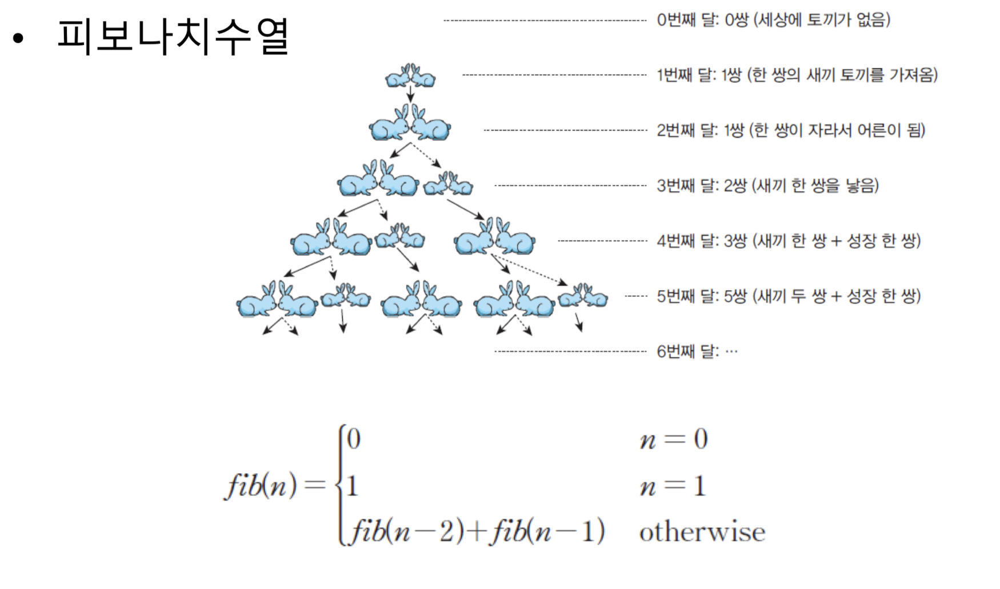

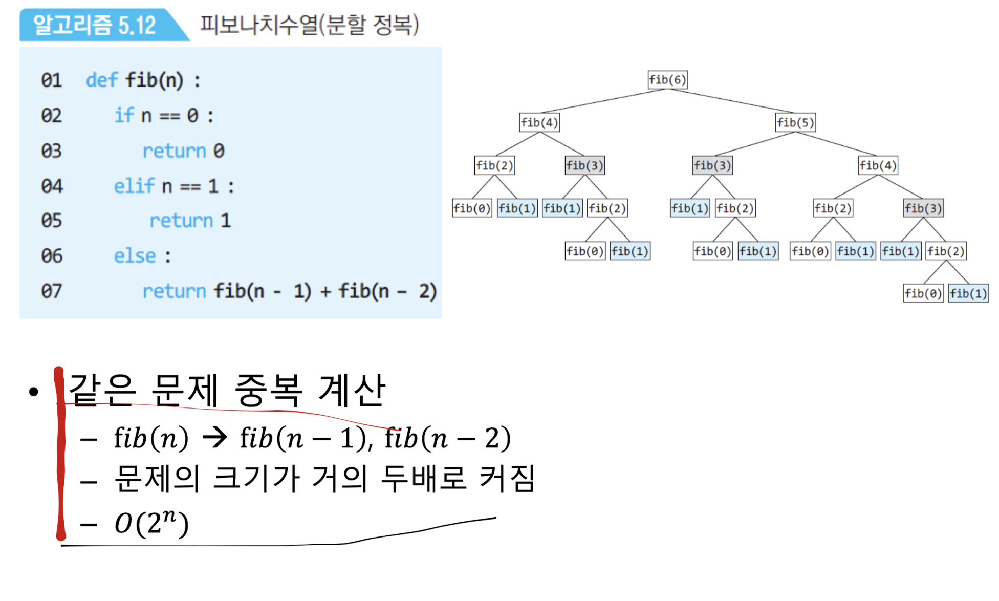

In [1]:
# Fibonacci (순환): O(2^n)

def fib(n) :

    if n == 0 :

        return 0    # 정복: 0번째 달

    elif n == 1 :

         return 1    # 정복: 1번째 달

    else : 

        return fib(n - 1) + fib(n - 2)# 분할(순환호출), 병합(결과 더하기)

 

########################################################################

# Fibonacci (반복): O(n)

def fib_iter(n) :

    if (n < 2): return n

    last = 0

    current = 1

    for i in range(2, n+1) :

        tmp = current

        current += last

        last = tmp

    return current

 

########################################################################

print('Fibonacci순환(5) = ', fib(5))

print('Fibonacci반복(5) = ', fib_iter(5))

for i in range (1, 35) :

    print('fib순환(%d)='%i, fib(i))

    print('fib반복(%d)='%i, fib_iter(i))

Fibonacci순환(5) =  5
Fibonacci반복(5) =  5
fib순환(1)= 1
fib반복(1)= 1
fib순환(2)= 1
fib반복(2)= 1
fib순환(3)= 2
fib반복(3)= 2
fib순환(4)= 3
fib반복(4)= 3
fib순환(5)= 5
fib반복(5)= 5
fib순환(6)= 8
fib반복(6)= 8
fib순환(7)= 13
fib반복(7)= 13
fib순환(8)= 21
fib반복(8)= 21
fib순환(9)= 34
fib반복(9)= 34
fib순환(10)= 55
fib반복(10)= 55
fib순환(11)= 89
fib반복(11)= 89
fib순환(12)= 144
fib반복(12)= 144
fib순환(13)= 233
fib반복(13)= 233
fib순환(14)= 377
fib반복(14)= 377
fib순환(15)= 610
fib반복(15)= 610
fib순환(16)= 987
fib반복(16)= 987
fib순환(17)= 1597
fib반복(17)= 1597
fib순환(18)= 2584
fib반복(18)= 2584
fib순환(19)= 4181
fib반복(19)= 4181
fib순환(20)= 6765
fib반복(20)= 6765
fib순환(21)= 10946
fib반복(21)= 10946
fib순환(22)= 17711
fib반복(22)= 17711
fib순환(23)= 28657
fib반복(23)= 28657
fib순환(24)= 46368
fib반복(24)= 46368
fib순환(25)= 75025
fib반복(25)= 75025
fib순환(26)= 121393
fib반복(26)= 121393
fib순환(27)= 196418
fib반복(27)= 196418
fib순환(28)= 317811
fib반복(28)= 317811
fib순환(29)= 514229
fib반복(29)= 514229
fib순환(30)= 832040
fib반복(30)= 832040
fib순환(31)= 1346269
fib반복(31)= 1346269
fib순환(32)= 21783

반복 구조 : 알고리즘 5.13  
O(n)  

행렬 거듭제곱  
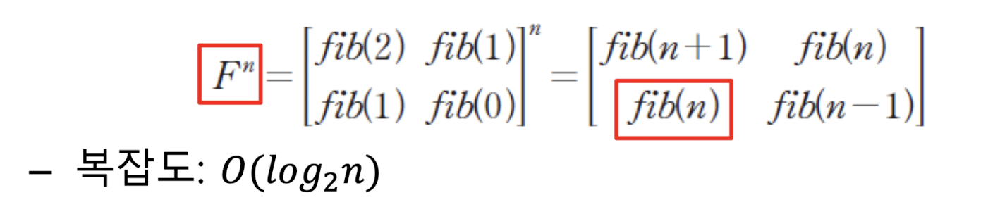
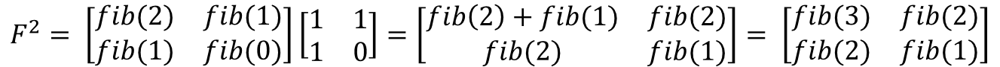
F^n에는 fib(n-1),fib(n),fib(n+1)이 행렬 요소  
따라서 이 행렬을 이용하면 n번째 피보나치 수열 쉽게~  
복잡도: 행렬의 거듭제고의 복잡도와 같이 O(log2^n)  

### 분할 정복기법
### 같은 부분 문제가 여러번 반복되어 나타나지 않을때만 사용!